In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
import random
import numpy as np
import matplotlib.pyplot as plt
import sys
from sklearn.decomposition import PCA
from sklearn import datasets
from scipy.spatial import distance
from scipy.optimize import differential_evolution

In [2]:
iris = datasets.load_iris() #Loading the dataset
iris.keys()

iris_data = pd.DataFrame(
    data= np.c_[iris['data'], iris['target']],
    columns= iris['feature_names'] + ['target']
    )

In [3]:
X = iris_data[iris_data.columns[:-1]]
y = iris_data.iloc[:,-1:]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [4]:
search_space = {
    0: {
        'd': (-5, 5),  # degré du polynome
        'c_re': (-2, 2),  # partie réelle de c
        'c_im': (-2, 2),  # partie imaginaire de c
        'x': (-2, 2),  # coordonnée x du centre
        'y': (-2, 2),  # coordonnée y du centre
        's': (0.1, 2),  # taille de la région
        'o': (-2, 2),
        'threshold': (0.4, 0.6),
        'maxiter':(25, 150),
    },
    1: {
        'd': (-5, 5),
        'c_re': (-2, 2),
        'c_im': (-2, 2),
        'x': (-2, 2),
        'y': (-2, 2),
        's': (0.1, 2),
        'o': (-2, 2),
        'threshold': (0.4, 0.6),
        'maxiter':(25, 150),
    },
    2: {
        'd': (-5, 5),
        'c_re': (-2, 2),
        'c_im': (-2, 2),
        'x': (-2, 2),
        'y': (-2, 2),
        's': (0.1, 2),
        'o': (-2, 2),
        'threshold': (0.4, 0.6),
        'maxiter':(25, 150),
    }
}

In [5]:
def initialize_particle(species):
    particle = {}
    for param, (low, high) in search_space[species].items():
        particle[param] = random.uniform(low, high)
    return particle

In [6]:
def generate_multibrot_fractal(d, c_re, c_im, x, y, s, o, threshold, maxiter, width=1000, height=1000,):
    # Initialise le tableau de valeurs
    maxiter = abs(maxiter)
    mandel_value = np.zeros((width, height))
    for i in range(width):
        for j in range(height):
            zx, zy = x + s * (i - width / 2) / (width / 2), y + s * (j - height / 2) / (height / 2)
            c = complex(c_re, c_im)
            z = complex(zx, zy)
            
            for k in range(int(maxiter) + 1):
                if abs(z) > 2.0:
                    break 
                z = complex(z.real, -z.imag) ** d + c - o
                
            mandel_value[i, j] = k

    # Binarisation du tableau en fonction d'un seuil
    scaled_threshold = np.min(mandel_value) + threshold * (np.max(mandel_value) - np.min(mandel_value))
    binary_fractal = np.where(mandel_value > scaled_threshold, 1, 0)

    return binary_fractal

In [7]:
def decide_label_based_on_boundary(point, fractal_boundary):
    x, y = point
    return fractal_boundary[x, y]

In [8]:
width, height = 1000, 1000
def generate_labels_with_multibrot(particle, X, x_min=None, x_max=None, y_min=None, y_max=None):
    # Générer la frontière de la fractale
    fractal_boundary = generate_multibrot_fractal(**particle, width=width, height=height)
    fig, ax = plt.subplots()
    ax.imshow(fractal_boundary, cmap='gray')
    
    # Utiliser PCA pour réduire la dimensionnalité de tout le dataset X
    pca = PCA(n_components=2)
    X_2d = pca.fit_transform(X)
    
    predicted_labels = []
    
    for x, y in X_2d:
        # Mettre à l'échelle les points
        x_transformed = int((x - x_min) / (x_max - x_min) * 1000-1)
        y_transformed = int((y - y_min) / (y_max - y_min) * 1000-1)
        
        label = decide_label_based_on_boundary((x_transformed, y_transformed), fractal_boundary)
        color = 'r' if label == 1 else 'b'  # rouge pour le label 1, bleu pour le label 0
        ax.scatter(y_transformed, x_transformed, c=color, marker="+")

        # Décider du label
        label = decide_label_based_on_boundary((x_transformed, y_transformed), fractal_boundary)
        predicted_labels.append(label)
        
    plt.title('Fractal with Points')
    plt.show()    
    return predicted_labels

In [9]:
def cost_function(particle, X_train, y_train_species, x_min, x_max, y_min, y_max):
    predicted_labels = generate_labels_with_multibrot(particle, X_train, x_min, x_max, y_min, y_max)
    error_rate = sum(predicted_labels != y_train_species) / len(y_train_species)
    return error_rate

In [10]:
# Initialisation
n_particles = 30
swarm = {species: [initialize_particle(species) for _ in range(n_particles)] for species in [0, 1, 2]}

# Initialiser les meilleurs scores à l'infini
pbest_score = {species: [float('inf')] * n_particles for species in [0, 1, 2]}
gbest_score = {species: float('inf') for species in [0, 1, 2]}
gbest_position = {species: {} for species in [0, 1, 2]}

# Paramètres de PSO
w = 0.5  # inertie
c1 = 1.5  # coefficient cognitif
c2 = 1.5  # coefficient social

X_total = np.concatenate((X_train, X_test), axis=0)

# Utiliser PCA sur X_total
pca = PCA(n_components=2)
X_total_2d = pca.fit_transform(X_total)

# Trouver les valeurs min et max pour la mise à l'échelle
x_min, x_max = X_total_2d[:, 0].min(), X_total_2d[:, 0].max()
y_min, y_max = X_total_2d[:, 1].min(), X_total_2d[:, 1].max()

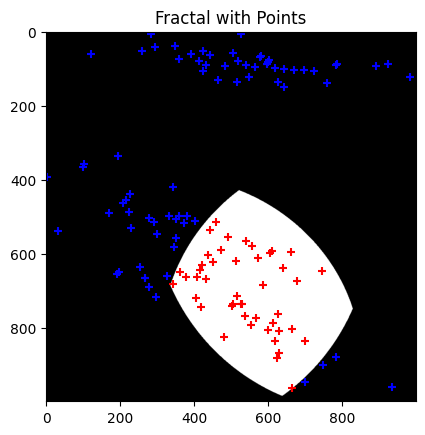

Nouveau meilleur taux d'erreur pour l'espèce 0: 0.7083333333333334, paramètres: {'d': 1.0115733098986812, 'c_re': 0.3469239984699617, 'c_im': -1.9431759525035415, 'x': 0.14183003209845957, 'y': -1.2588050432226252, 's': 1.7513020616399972, 'o': 0.5668842039474207, 'threshold': 0.47708069363336364, 'maxiter': 82.59653930494144}


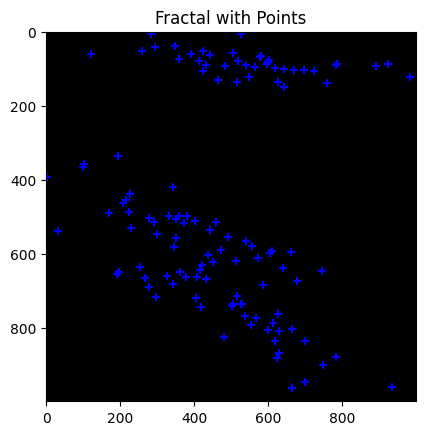

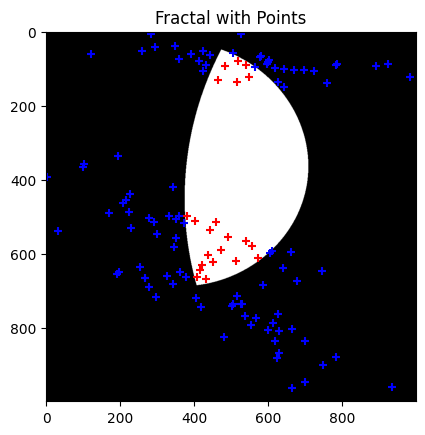

Nouveau meilleur taux d'erreur pour l'espèce 0: 0.4166666666666667, paramètres: {'d': 1.6300994118071523, 'c_re': 1.7918064871892683, 'c_im': -1.3675600279111677, 'x': 0.11085051545709668, 'y': -1.7102455543763728, 's': 1.1523789485596296, 'o': -1.3428285926689054, 'threshold': 0.5501468145033938, 'maxiter': 70.2501804529575}


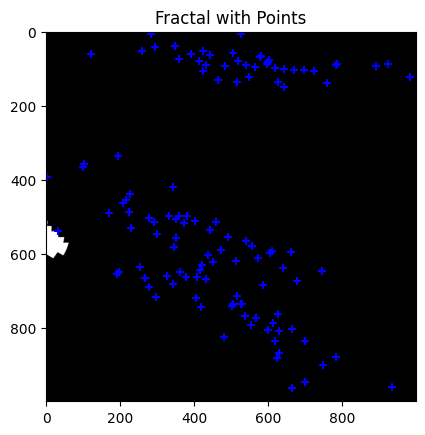

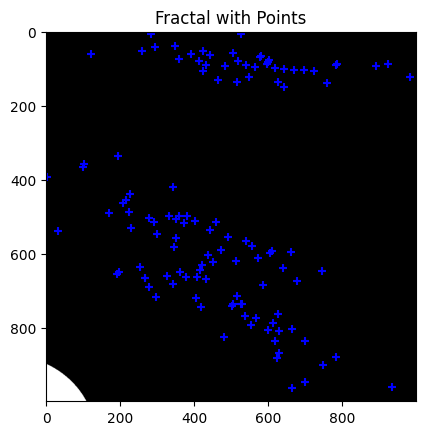

Nouveau meilleur taux d'erreur pour l'espèce 0: 0.3333333333333333, paramètres: {'d': -2.14107203126068, 'c_re': -0.2027108425302111, 'c_im': -1.9691559070197822, 'x': -0.5351049910888137, 'y': 1.7094752513391098, 's': 0.8071470000450905, 'o': -1.9698227181582757, 'threshold': 0.5731478772768135, 'maxiter': 86.56966327278181}


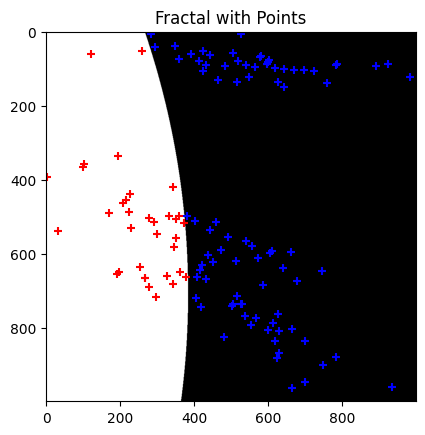

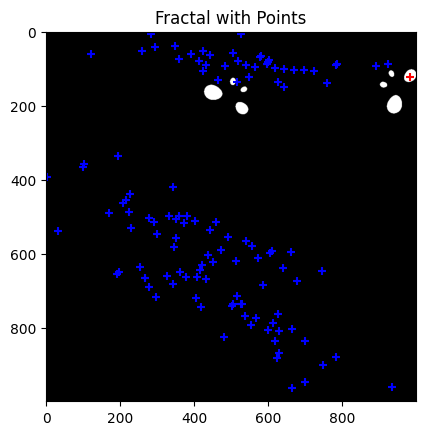

Nouveau meilleur taux d'erreur pour l'espèce 0: 0.325, paramètres: {'d': -3.998079029226532, 'c_re': 0.3364490151752402, 'c_im': 0.4788269650025745, 'x': 1.493345898313525, 'y': -0.5635866092375594, 's': 1.3255563804092074, 'o': -1.7958533332986164, 'threshold': 0.42577735583506054, 'maxiter': 29.827393781306075}


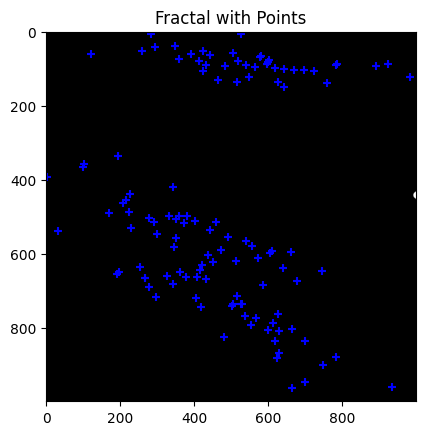

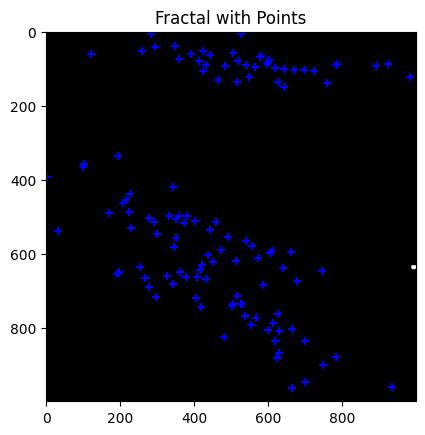

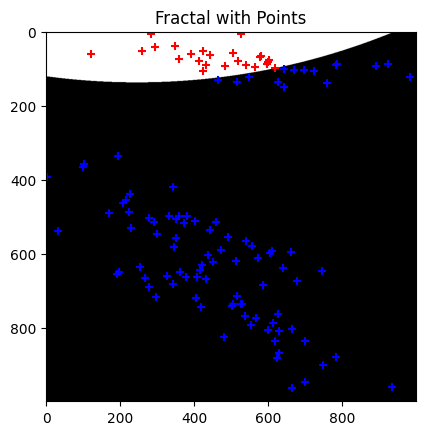

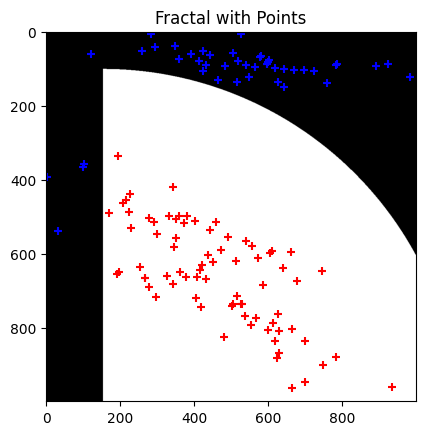

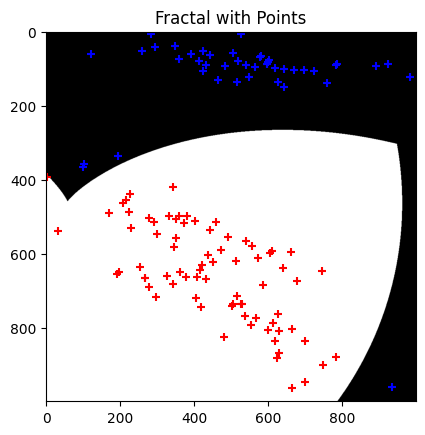

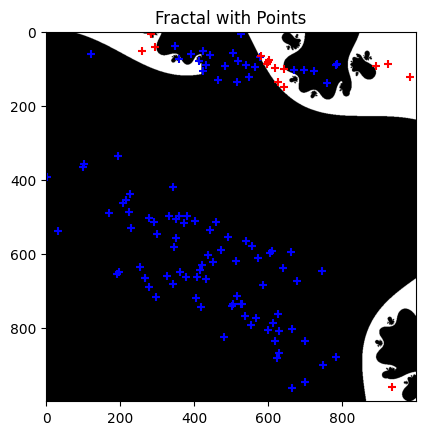

Nouveau meilleur taux d'erreur pour l'espèce 0: 0.21666666666666667, paramètres: {'d': -4.433158182274425, 'c_re': -0.6645585189597614, 'c_im': 1.3848639565146104, 'x': -0.167857872103105, 'y': 0.12303646645220345, 's': 0.7650778917465219, 'o': 0.03064013231542395, 'threshold': 0.560427067338843, 'maxiter': 109.07062116076452}


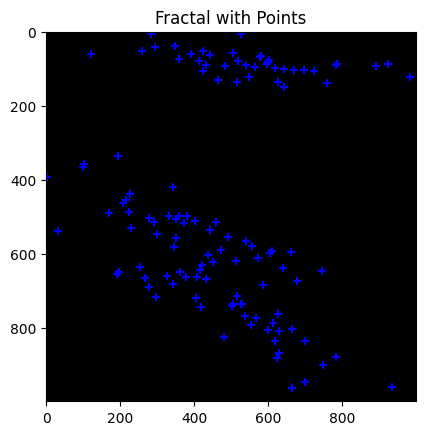

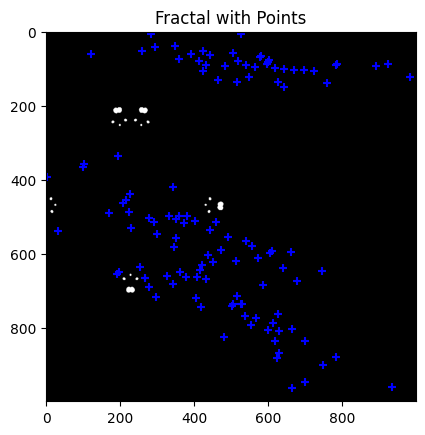

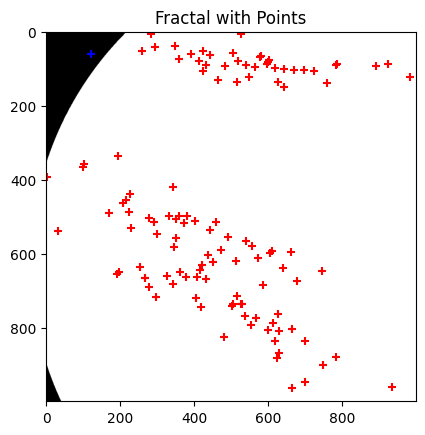

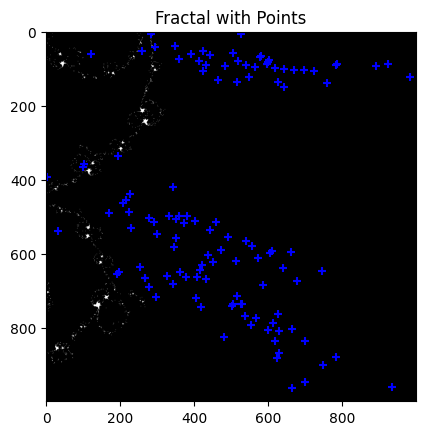

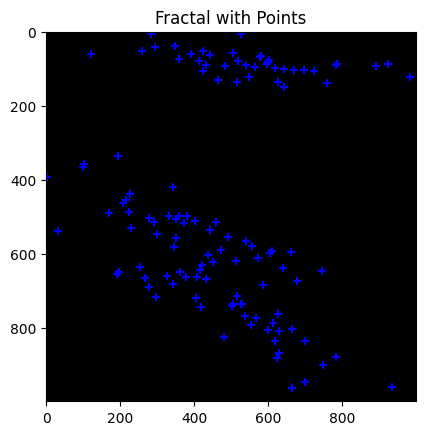

...

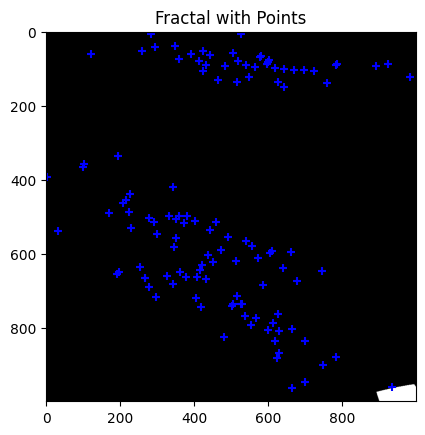

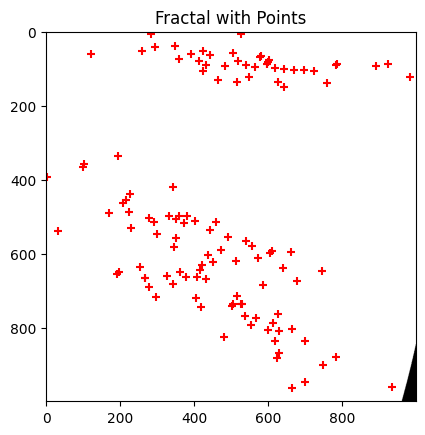

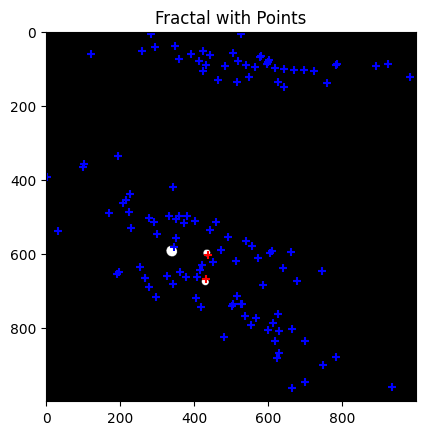

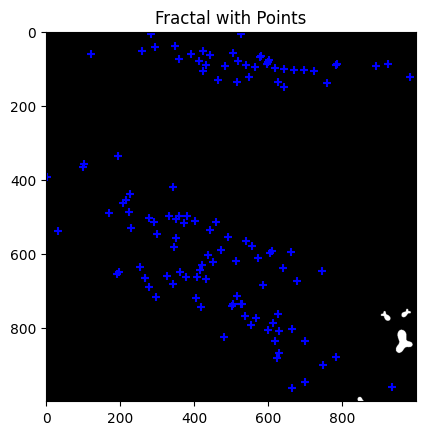

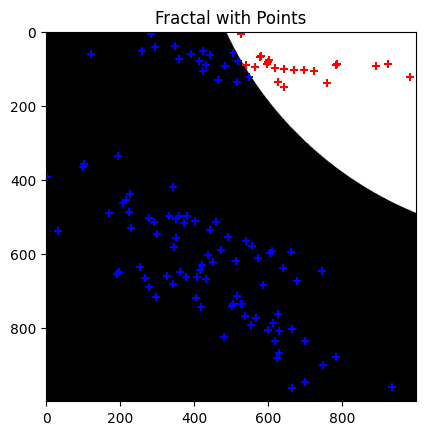

Nouveau meilleur taux d'erreur pour l'espèce 0: 0.15, paramètres: {'d': -4.963161782736233, 'c_re': -1.0619710119006207, 'c_im': 1.6371360943814932, 'x': 1.8675821966322639, 'y': -1.7828155638390468, 's': 1.0221190777169917, 'o': -1.6195464092125569, 'threshold': 0.48912135590197325, 'maxiter': 102.81956340371576}


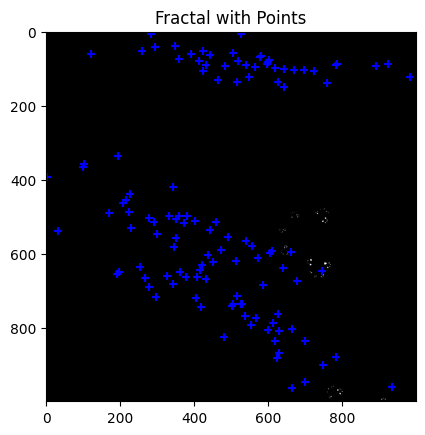

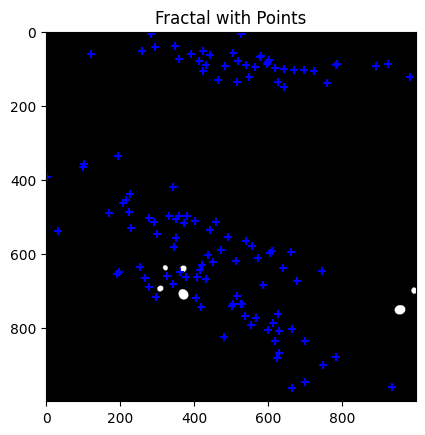

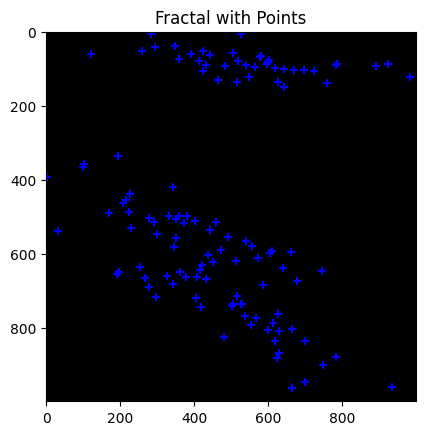

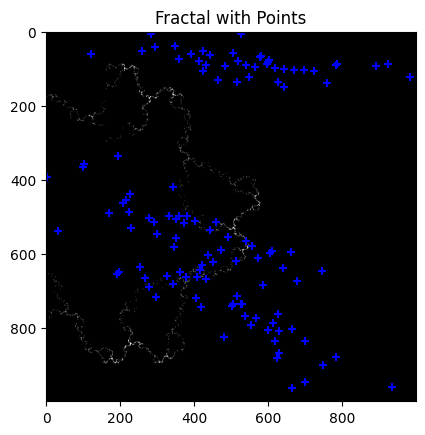

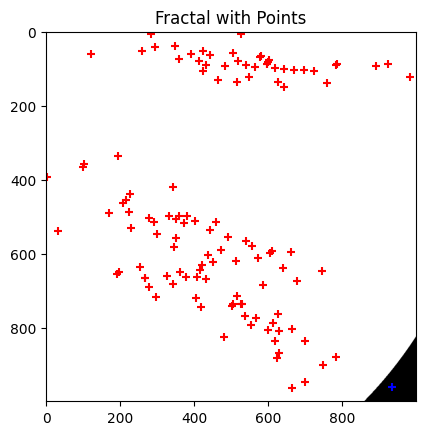

...

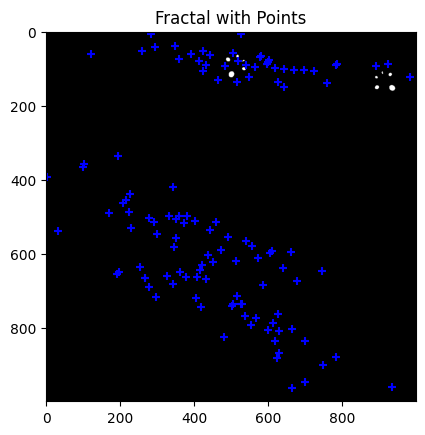

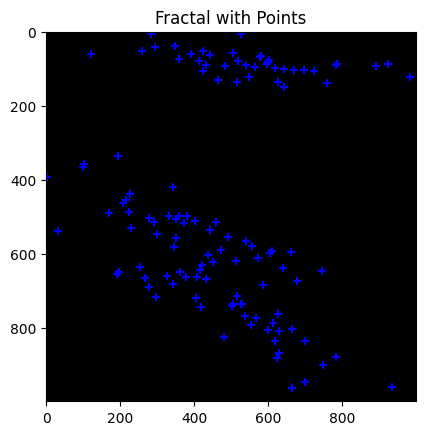

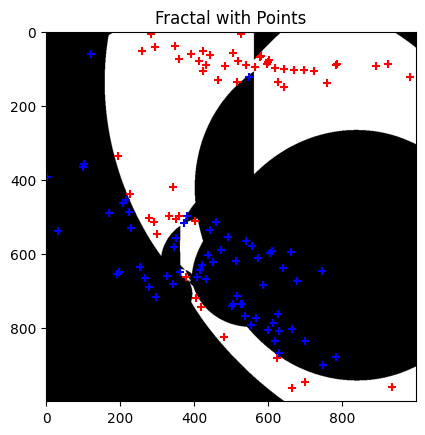

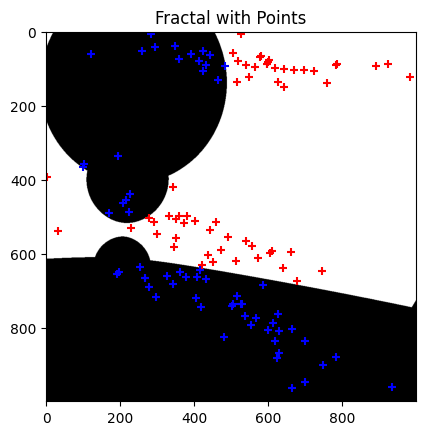

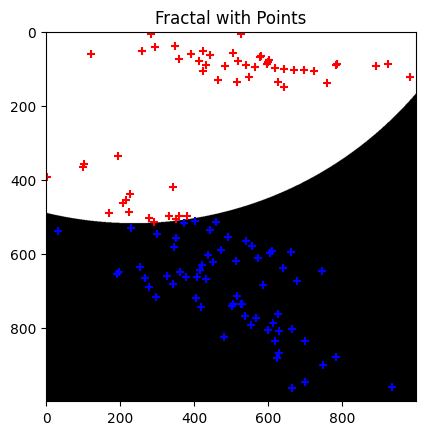

Nouveau meilleur taux d'erreur pour l'espèce 0: 0.13333333333333333, paramètres: {'d': -0.08138209291775222, 'c_re': 0.07941097923134022, 'c_im': 1.3457195022796897, 'x': 1.9627755788426442, 'y': 0.5246555325277704, 's': 0.9929265300325477, 'o': 1.7221102647795057, 'threshold': 0.4448442023838577, 'maxiter': 54.89975602699559}


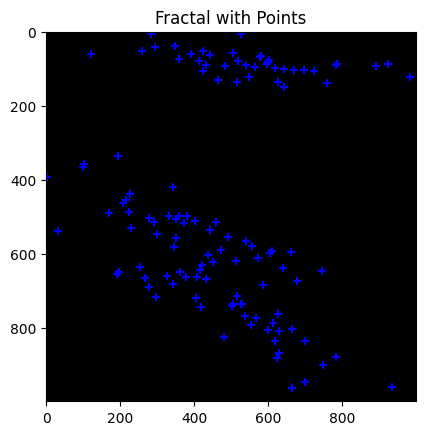

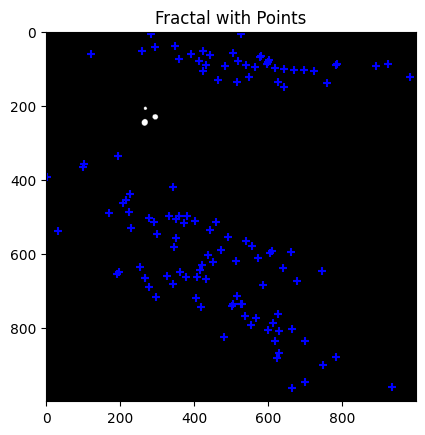

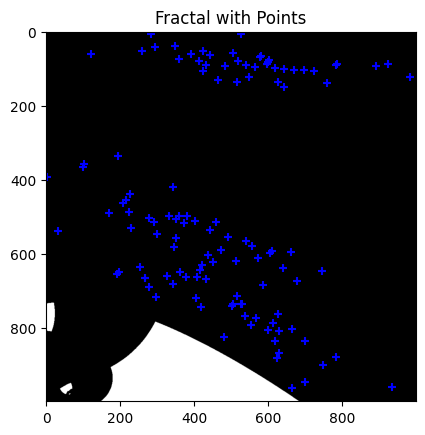

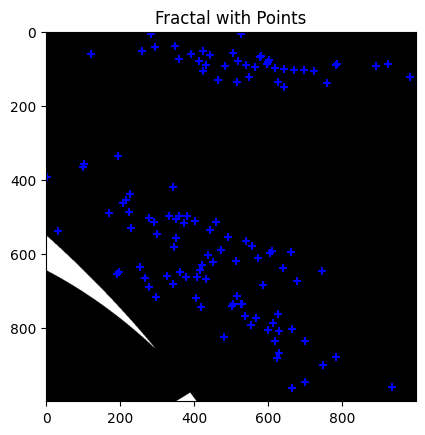

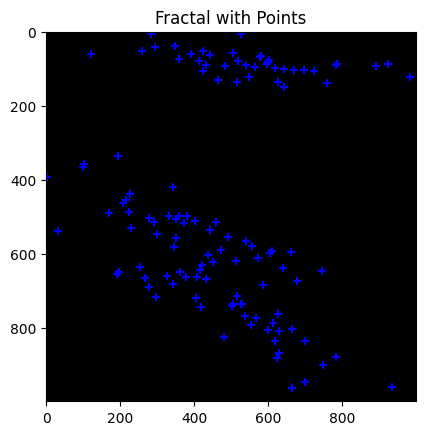

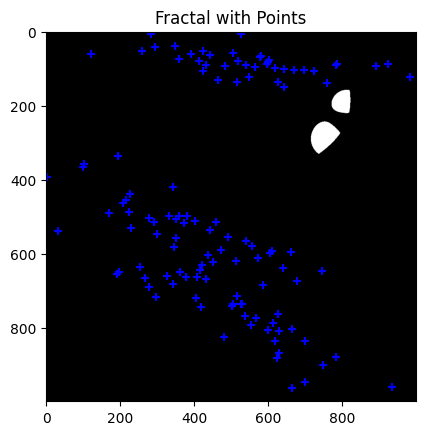

Nouveau meilleur taux d'erreur pour l'espèce 1: 0.3416666666666667, paramètres: {'d': -1.8337567076791261, 'c_re': 0.06691610564631034, 'c_im': -0.8203272855799049, 'x': 0.7499765429372456, 'y': -1.5413889089182518, 's': 1.7729965635833196, 'o': -1.8746179601643211, 'threshold': 0.45069791616336563, 'maxiter': 49.12114843155566}


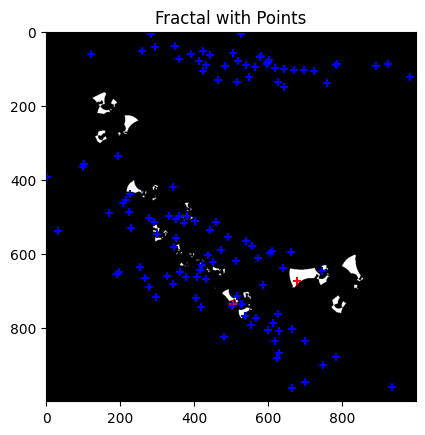

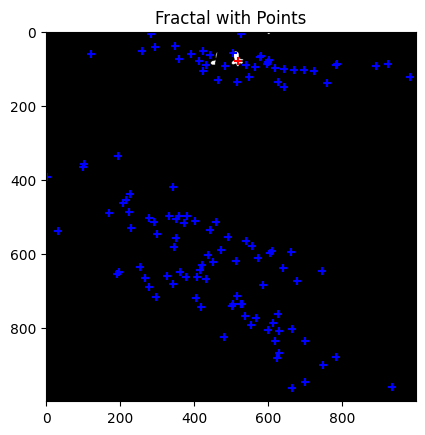

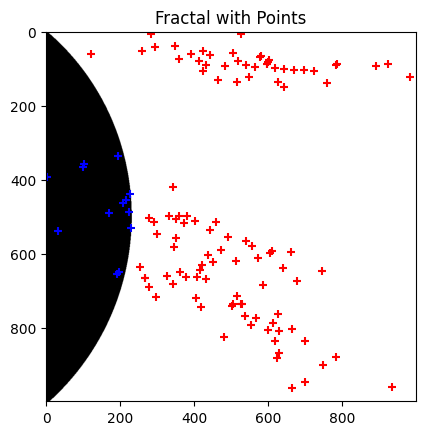

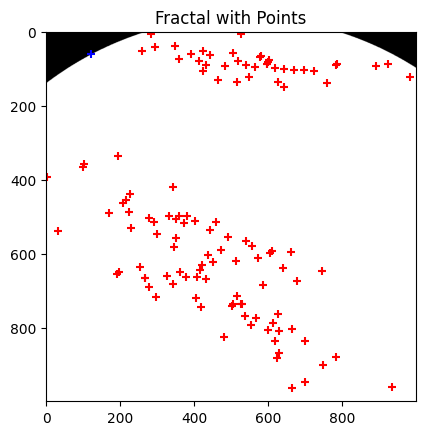

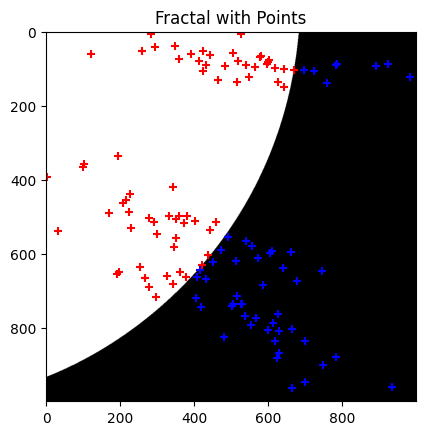

...

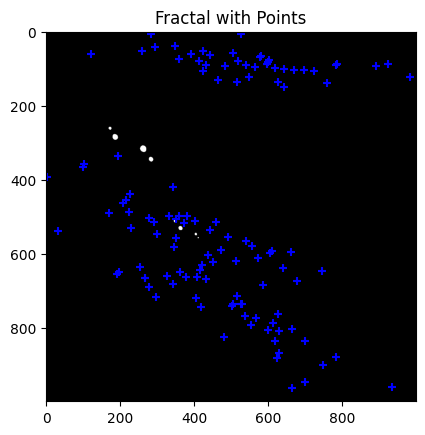

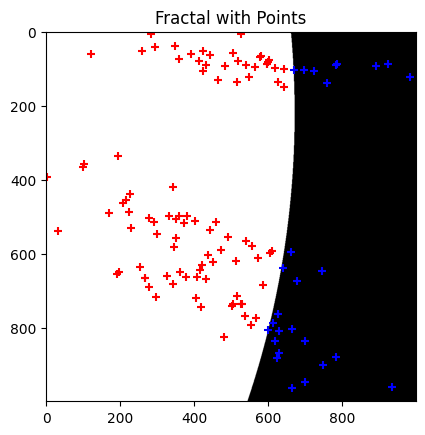

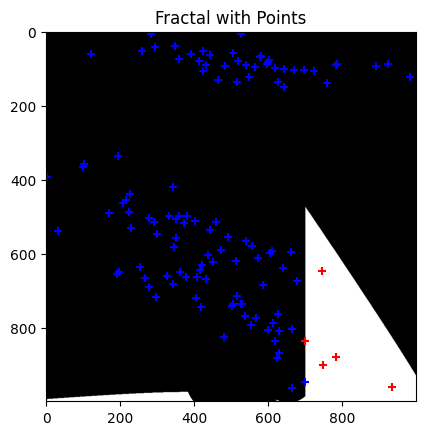

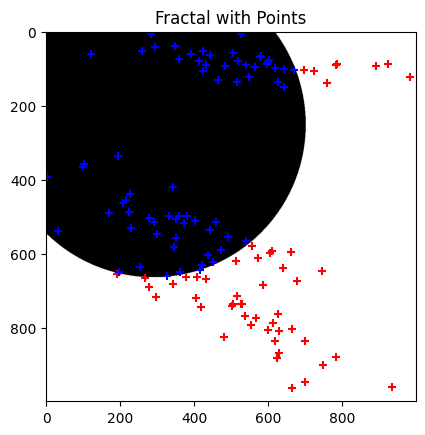

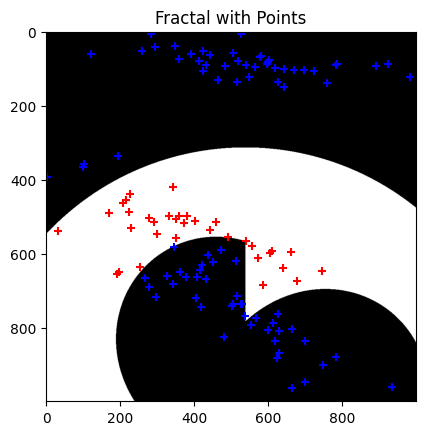

Nouveau meilleur taux d'erreur pour l'espèce 1: 0.125, paramètres: {'d': -1.328639592725629, 'c_re': -0.7964267154963487, 'c_im': 0.7464559744000101, 'x': -1.494534292115512, 'y': -0.10350527935389975, 's': 1.3593039025503342, 'o': 0.32628911236306646, 'threshold': 0.49859703879151257, 'maxiter': 141.26069254109998}


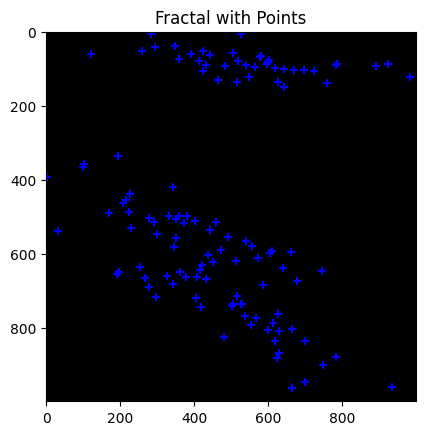

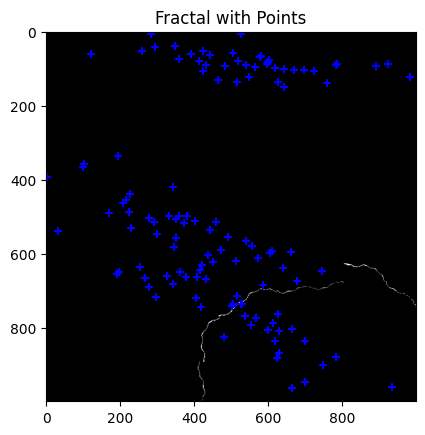

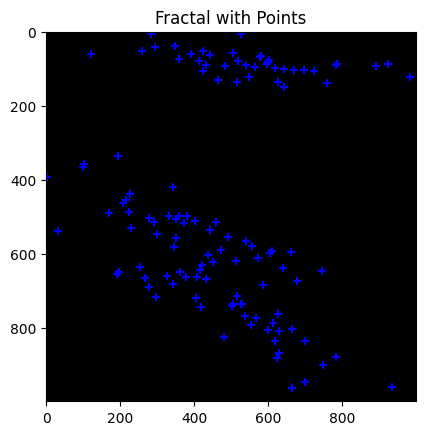

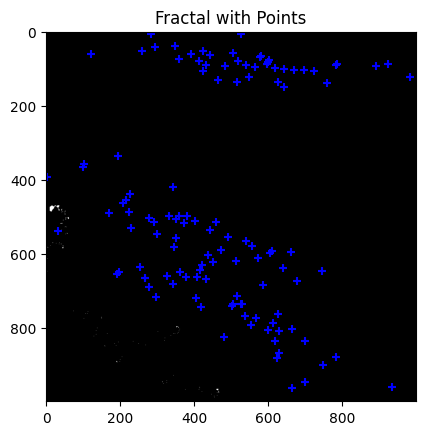

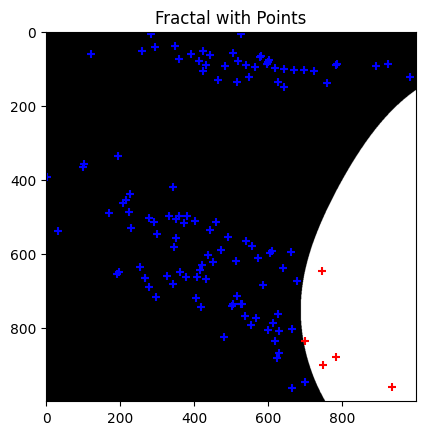

...

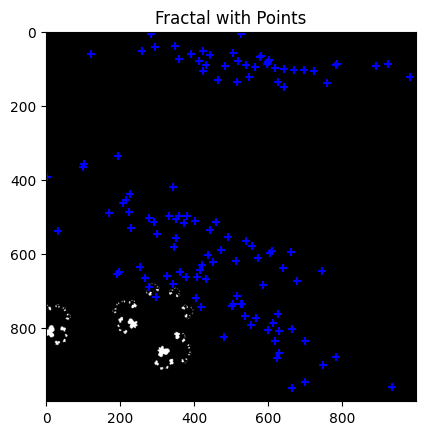

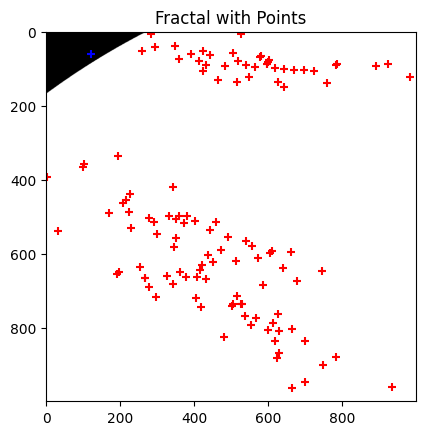

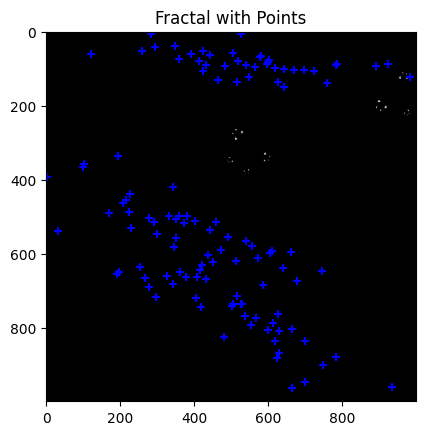

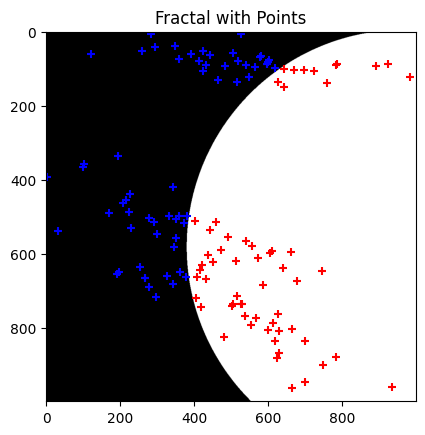

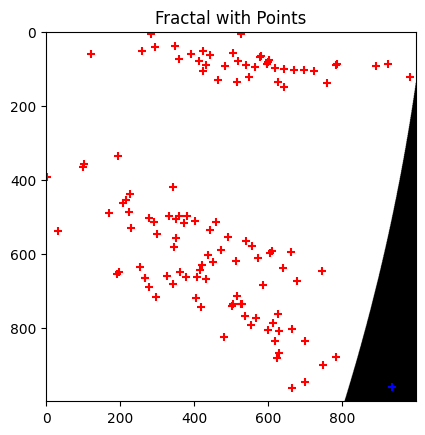

Nouveau meilleur taux d'erreur pour l'espèce 2: 0.6833333333333333, paramètres: {'d': 0.9540244729727867, 'c_re': 1.1815602749041085, 'c_im': -0.06413476594860112, 'x': -0.09657775021389492, 'y': 1.7529941525643427, 's': 0.18192989960404402, 'o': 0.6702248016733217, 'threshold': 0.4007290321153163, 'maxiter': 144.45369372010254}


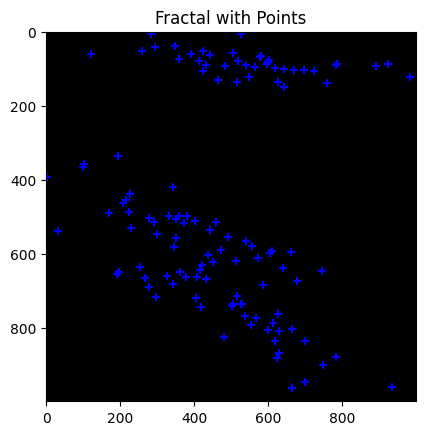

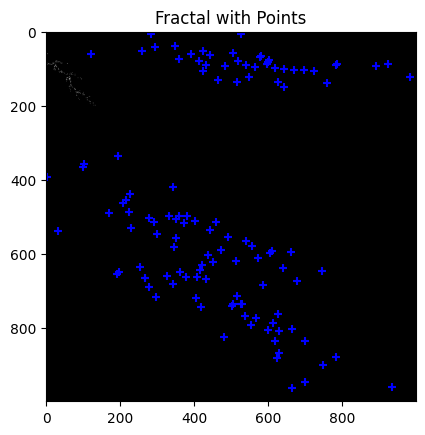

Nouveau meilleur taux d'erreur pour l'espèce 2: 0.325, paramètres: {'d': 1.350239882947621, 'c_re': 1.008302070667432, 'c_im': -0.7194631577026298, 'x': 1.5192310356209666, 'y': 1.537513641853792, 's': 1.3344380149150254, 'o': 0.9620420204050206, 'threshold': 0.5297572074933357, 'maxiter': 65.64282032810465}


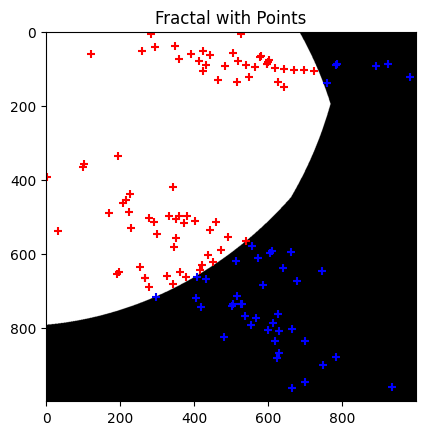

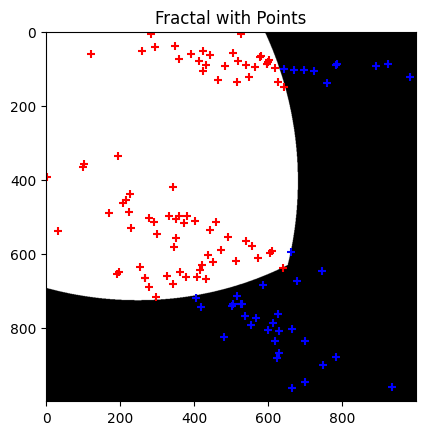

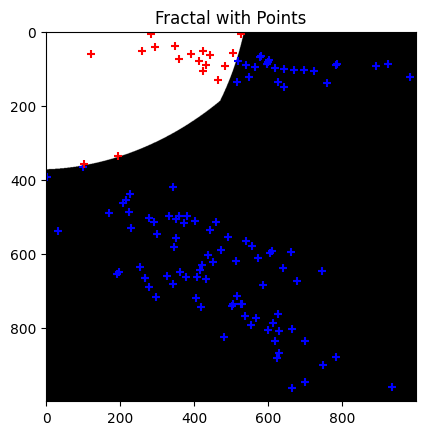

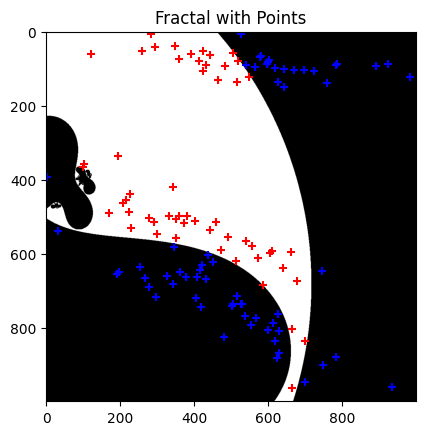

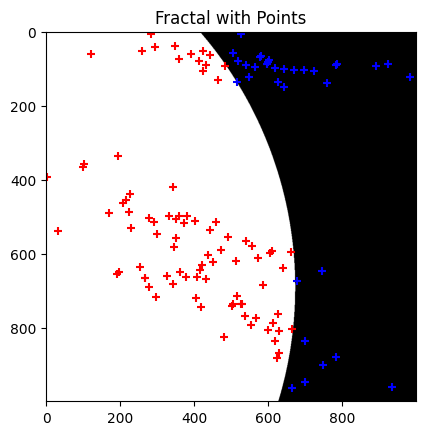

...

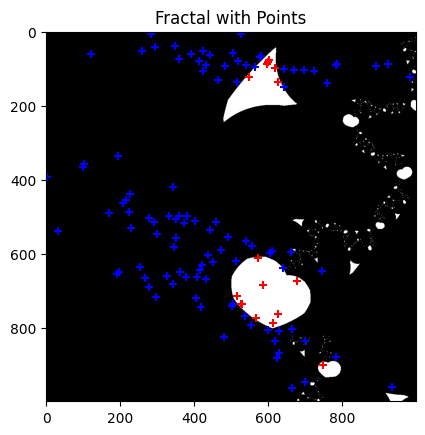

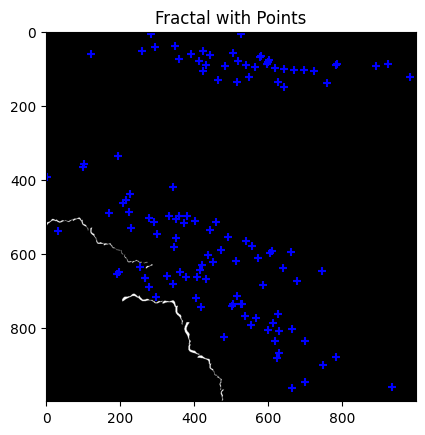

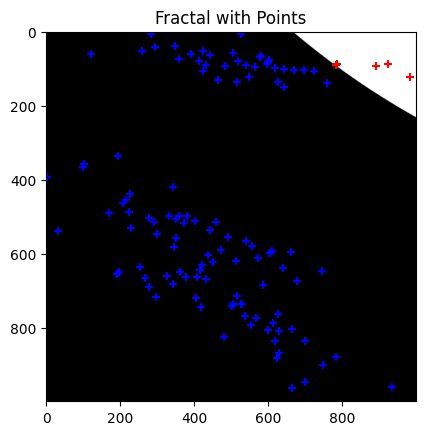

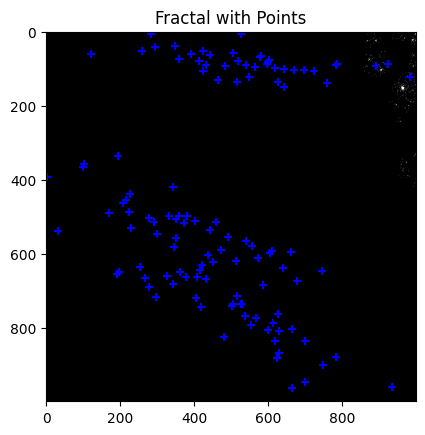

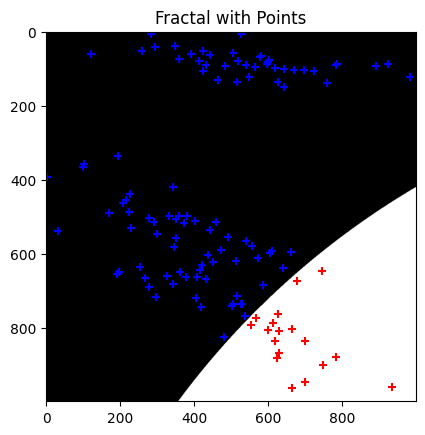

Nouveau meilleur taux d'erreur pour l'espèce 2: 0.20833333333333334, paramètres: {'d': -3.792617482586298, 'c_re': -0.7482952588593212, 'c_im': -1.9943283671687086, 'x': -1.6502322744482276, 'y': -1.475979981187598, 's': 0.46116993562524555, 'o': -1.3622279909898873, 'threshold': 0.47420217441839996, 'maxiter': 64.65808061746014}


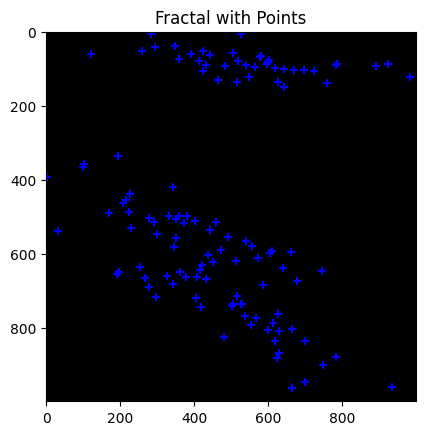

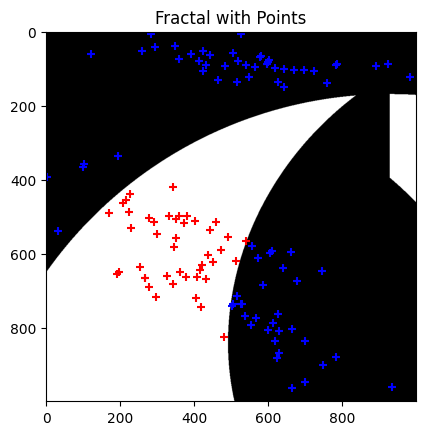

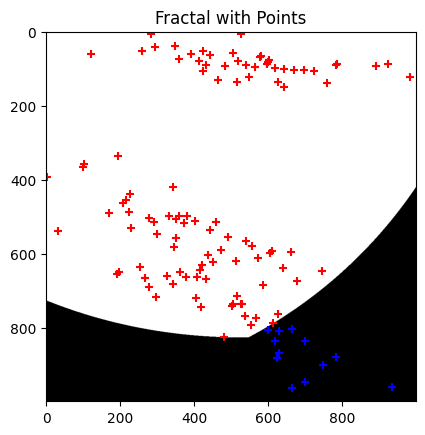

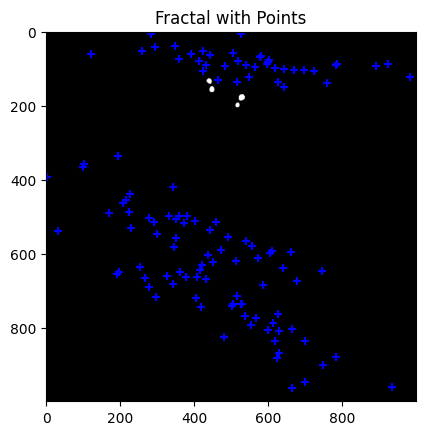

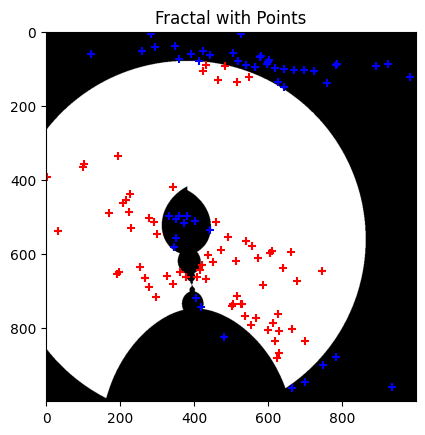

...

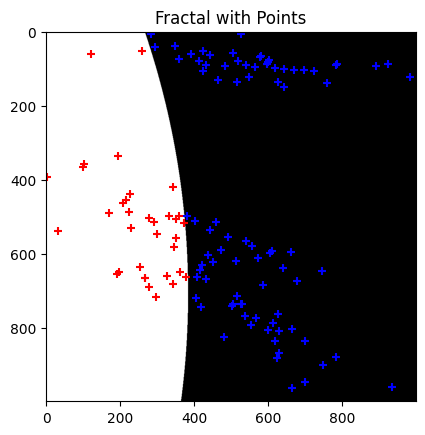

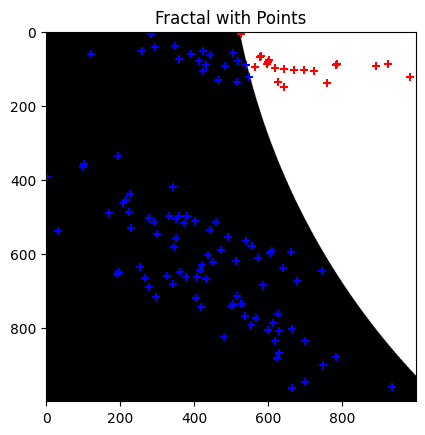

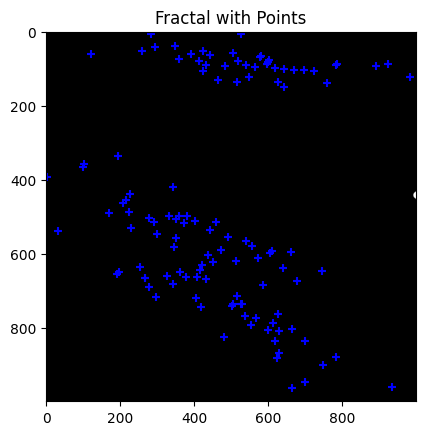

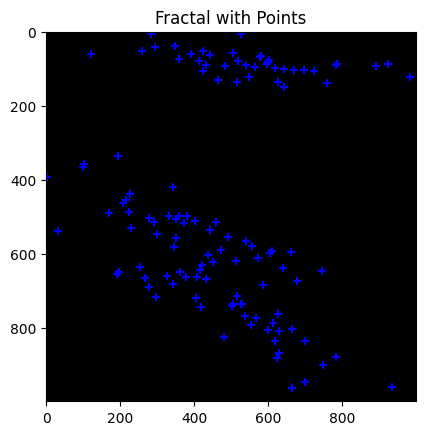

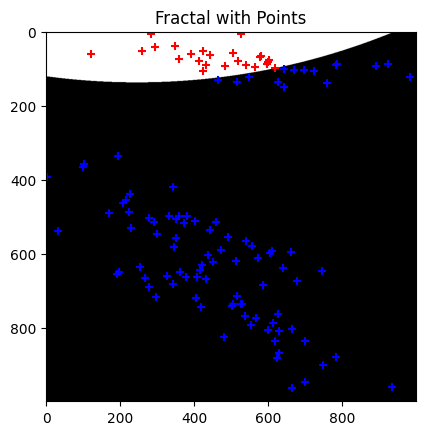

Nouveau meilleur taux d'erreur pour l'espèce 0: 0.125, paramètres: {'d': -2.086489138639691, 'c_re': 0.3737488732895291, 'c_im': 1.1367181618867606, 'x': 2.3943709899492065, 'y': 0.27762175619905216, 's': 0.5450805261268713, 'o': -2.3809873637681327, 'threshold': 0.5113114664558287, 'maxiter': 14.816433349303296}


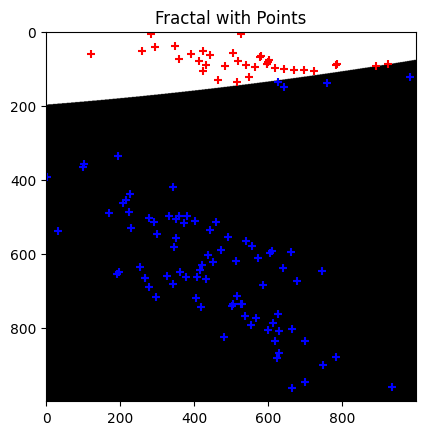

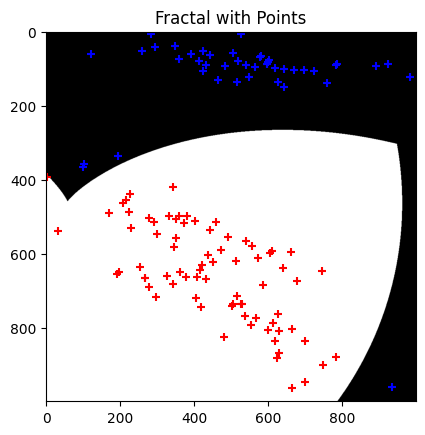

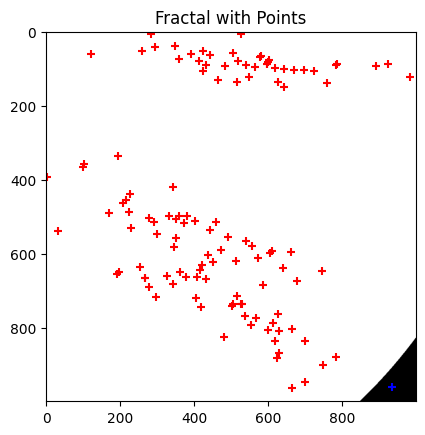

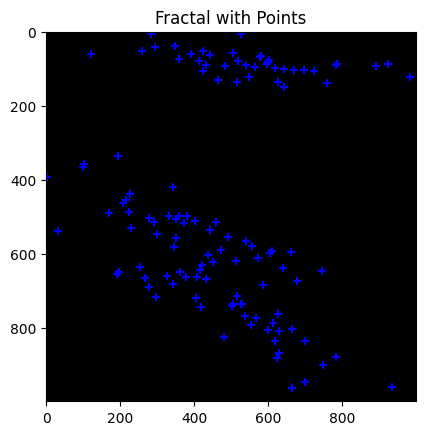

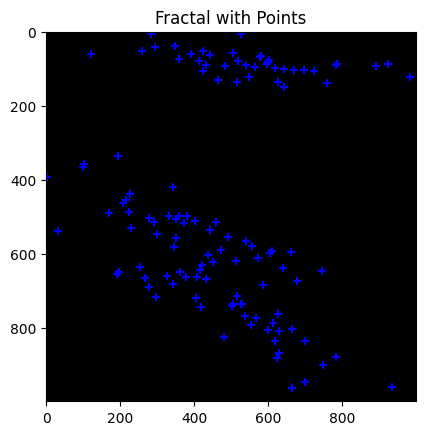

...

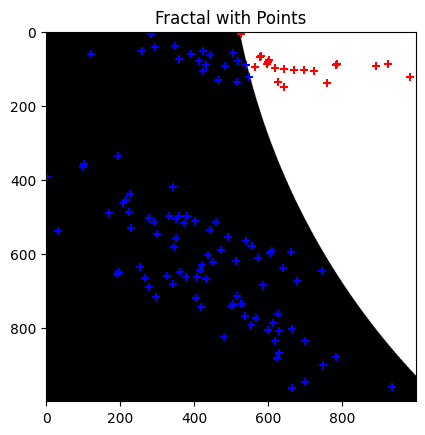

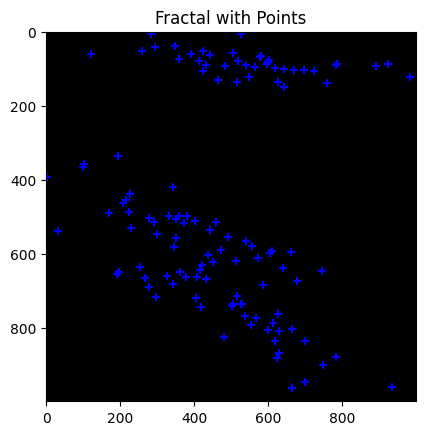

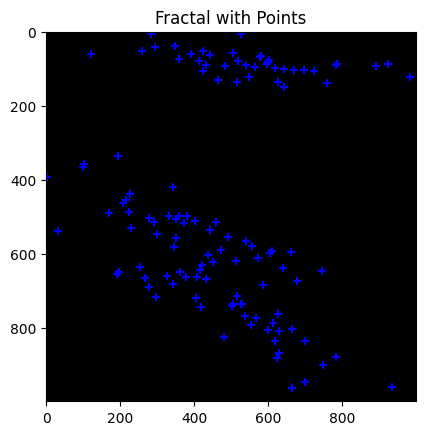

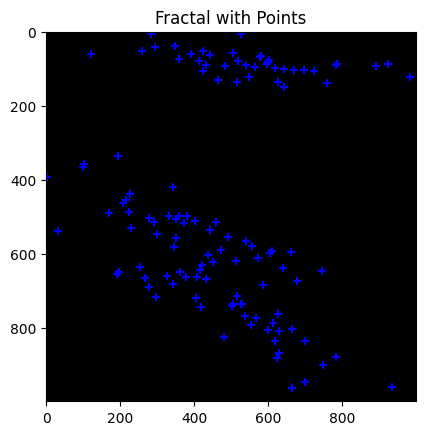

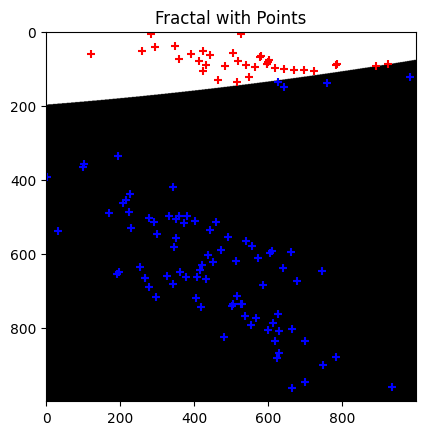

Nouveau meilleur taux d'erreur pour l'espèce 0: 0.03333333333333333, paramètres: {'d': 1.1585154505604054, 'c_re': 0.19556400088400872, 'c_im': 0.45207757020594186, 'x': 2.0452403336267455, 'y': 0.24094466494389497, 's': 0.08509376585087935, 'o': -0.06144187795203182, 'threshold': 0.11464538335304786, 'maxiter': 15.397863547074413}


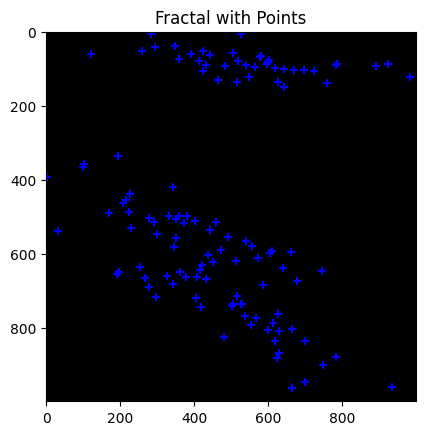

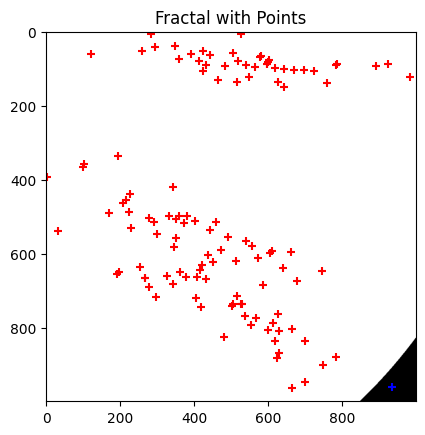

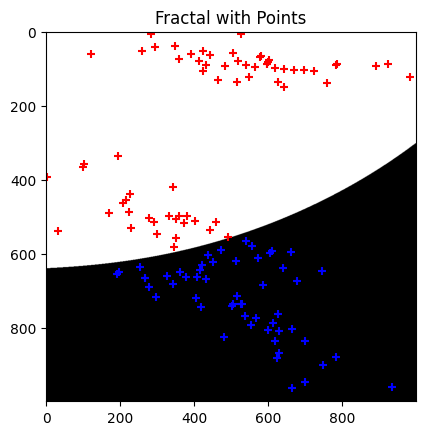

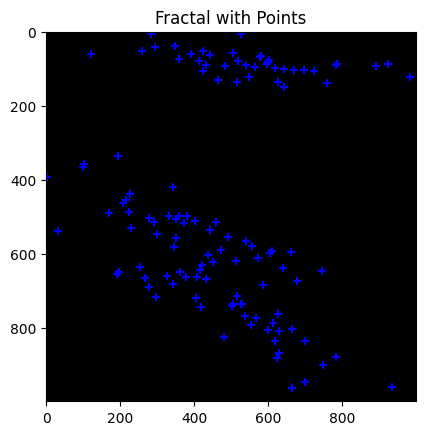

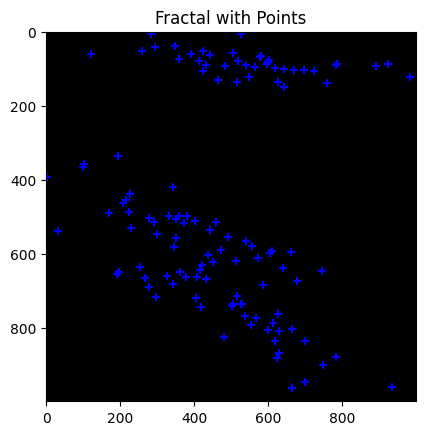

...

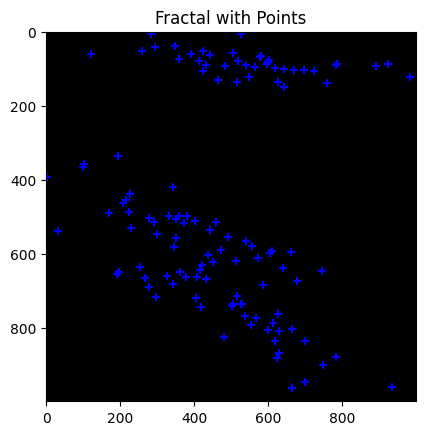

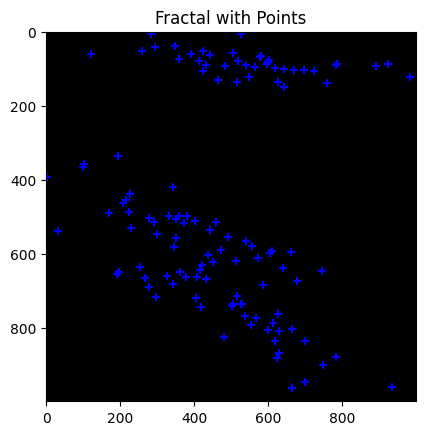

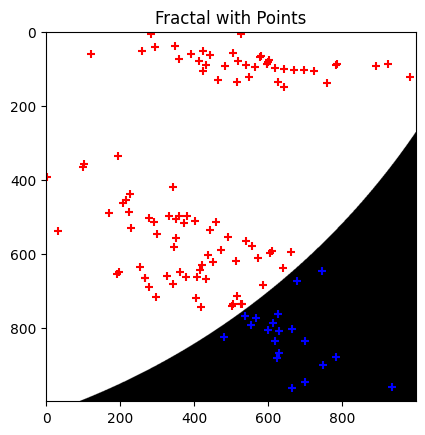

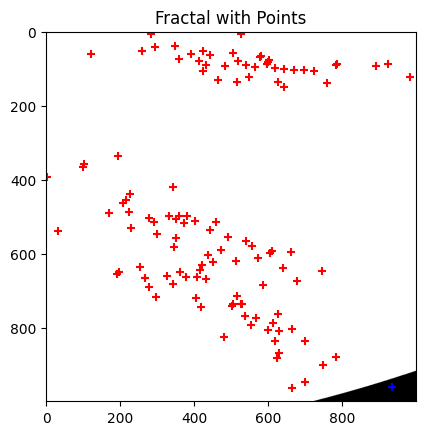

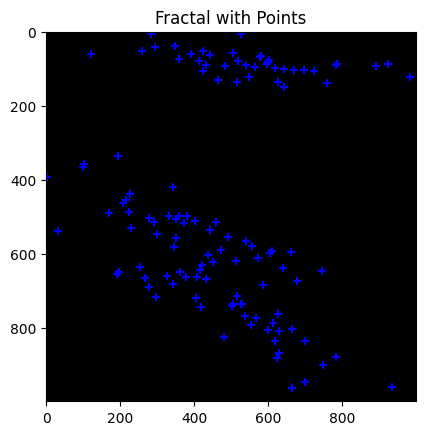

In [11]:
max_iterations = 3

# Boucle principale d'optimisation
for iter in range(max_iterations):
    for species in [0, 1, 2]:
        y_train_species = np.where(y_train == species, 1, 0)
        
        for i in range(n_particles):
            # Évaluation de la fitness de la particule actuelle
            particle = swarm[species][i]
            fitness = cost_function(particle, X_train, y_train_species.flatten(), x_min, x_max, y_min, y_max)
            
            # Mise à jour des meilleurs scores individuels
            if fitness < pbest_score[species][i]:
                pbest_score[species][i] = fitness

            # Mise à jour des meilleurs scores globaux
            if fitness < gbest_score[species]:
                gbest_score[species] = fitness
                gbest_position[species] = particle
                print(f"Nouveau meilleur taux d'erreur pour l'espèce {species}: {fitness}, paramètres: {particle}")

            # Mise à jour des positions et vitesses des particules
            new_particle = {}
            for param, value in particle.items():
                r1, r2 = random.random(), random.random()
                w = 0.5  # inertie (tu as déjà défini cela plus tôt, pas besoin de le redéfinir)
                
                # Calcul de la nouvelle "vitesse" pour chaque dimension (param)
                new_velocity = w * value + c1 * r1 * (pbest_score[species][i] - value) + c2 * r2 * (gbest_score[species] - value)
                
                # Mise à jour de la position
                new_particle[param] = value + new_velocity
            
            # Mise à jour de la particule dans l'essaim
            swarm[species][i] = new_particle

            # Tu pourrais aussi ajouter un code pour vérifier si le nouvel état améliore le score et l'afficher si c'est le cas
            new_fitness = cost_function(new_particle, X_train, y_train_species.flatten(), x_min, x_max, y_min, y_max)
                



In [12]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [13]:
binary_fractals = {}

for species in [0, 1, 2]:
    best_params = gbest_position[species]
    print(best_params)
    binary_fractals[species] = generate_multibrot_fractal(
        best_params['d'],
        best_params['c_re'],
        best_params['c_im'],
        best_params['x'],
        best_params['y'],
        best_params['s'],
        best_params['o'],
        best_params['threshold'],
        best_params['maxiter'],
        width=1000,
        height=1000,
    )

{'d': 1.1585154505604054, 'c_re': 0.19556400088400872, 'c_im': 0.45207757020594186, 'x': 2.0452403336267455, 'y': 0.24094466494389497, 's': 0.08509376585087935, 'o': -0.06144187795203182, 'threshold': 0.11464538335304786, 'maxiter': 15.397863547074413}
{'d': -1.328639592725629, 'c_re': -0.7964267154963487, 'c_im': 0.7464559744000101, 'x': -1.494534292115512, 'y': -0.10350527935389975, 's': 1.3593039025503342, 'o': 0.32628911236306646, 'threshold': 0.49859703879151257, 'maxiter': 141.26069254109998}
{'d': -3.792617482586298, 'c_re': -0.7482952588593212, 'c_im': -1.9943283671687086, 'x': -1.6502322744482276, 'y': -1.475979981187598, 's': 0.46116993562524555, 'o': -1.3622279909898873, 'threshold': 0.47420217441839996, 'maxiter': 64.65808061746014}


In [14]:
def knn_find_closest_boundary(binary_fractals, point_coordinates, target_value):
    boundary_label = None
    minimal_distance = float('inf')  # Initialisation

    for species, fractal in binary_fractals.items():
        plt.imshow(fractal, cmap='gray')  # Affichage de la matrice comme une image en niveaux de gris
        plt.title(f'Fractal for species {species}')
        plt.show()
        for i in range(fractal.shape[0]):
            for j in range(fractal.shape[1]):
                if fractal[i, j] == target_value:
                    current_distance = np.sqrt((i - point_coordinates[0]) ** 2 + (j - point_coordinates[1]) ** 2)
                    
                    if current_distance < minimal_distance:
                        minimal_distance = current_distance
                        boundary_label = species

    return boundary_label

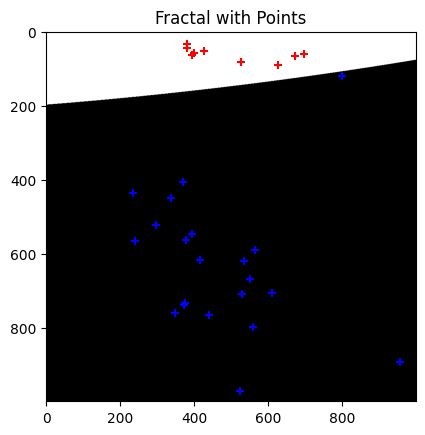

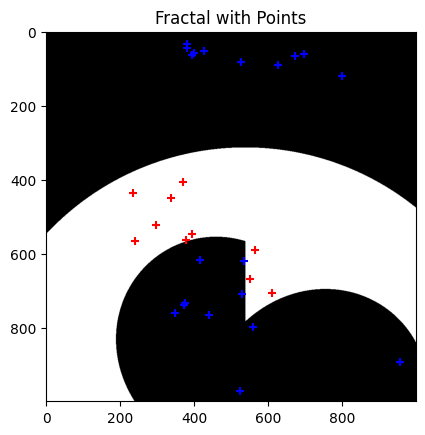

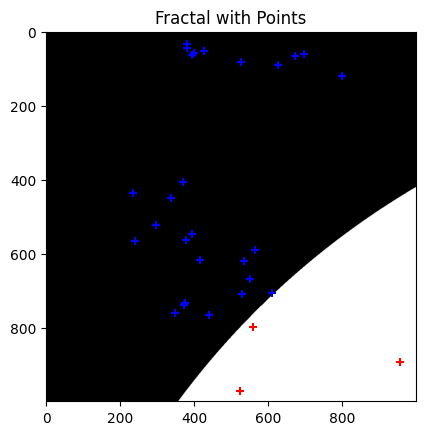

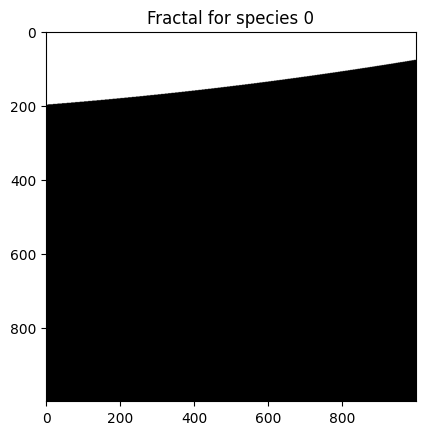

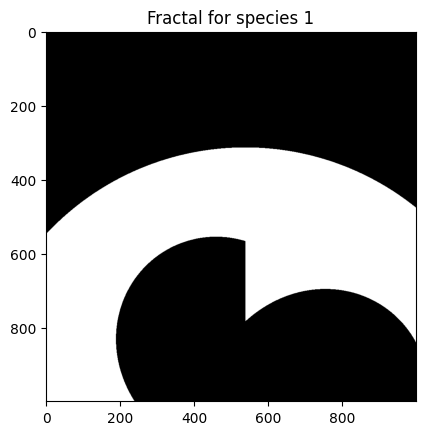

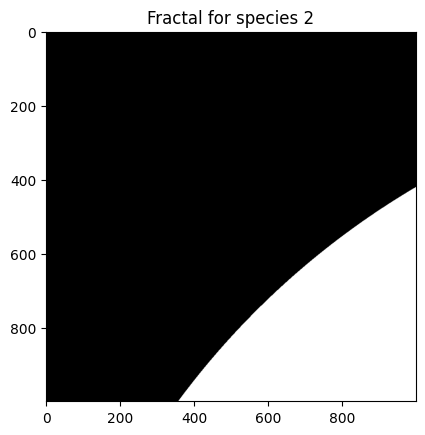

dans aucune fractale


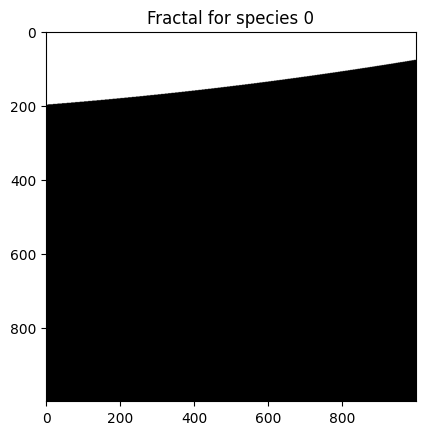

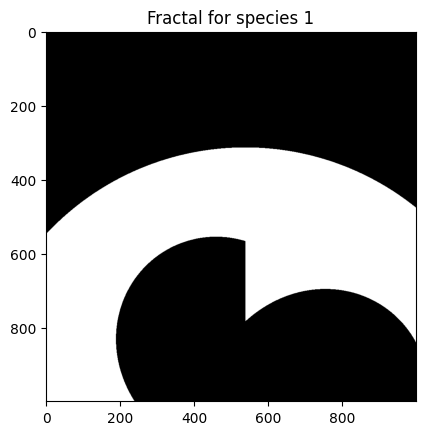

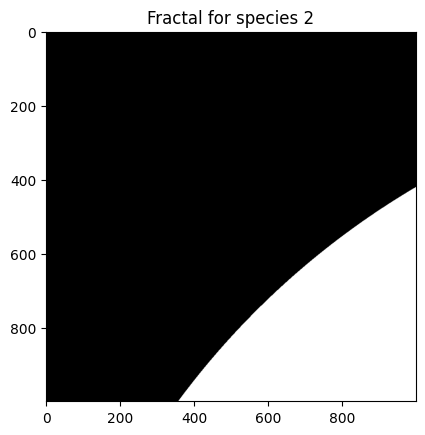

dans aucune fractale


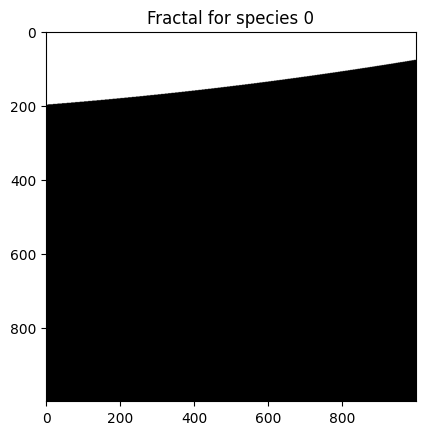

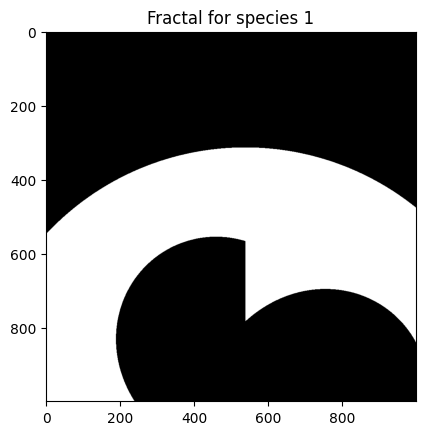

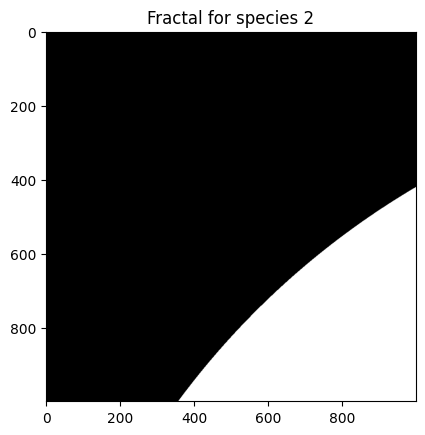

dans aucune fractale


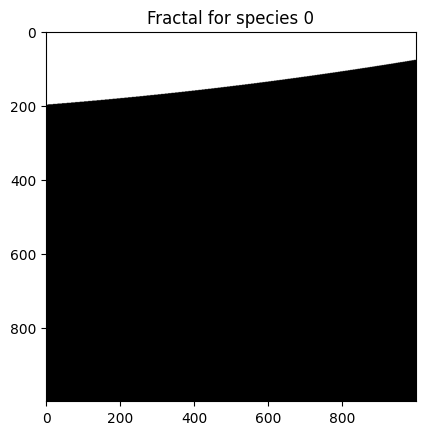

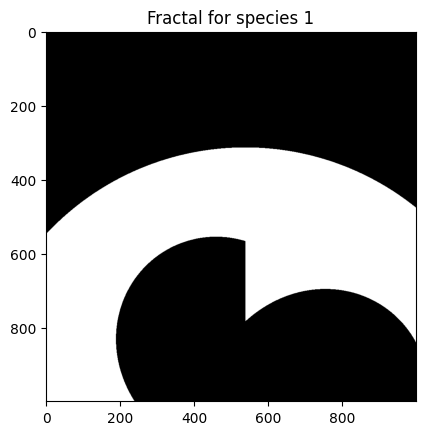

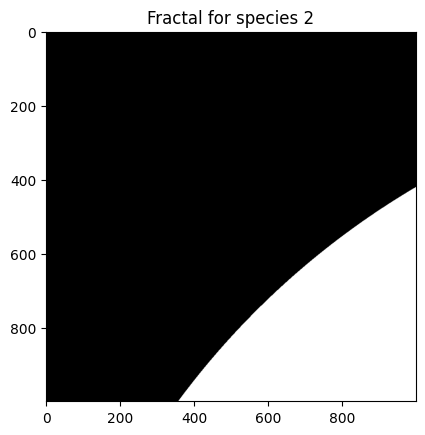

dans aucune fractale


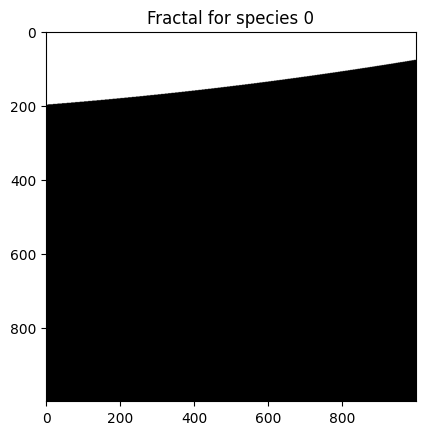

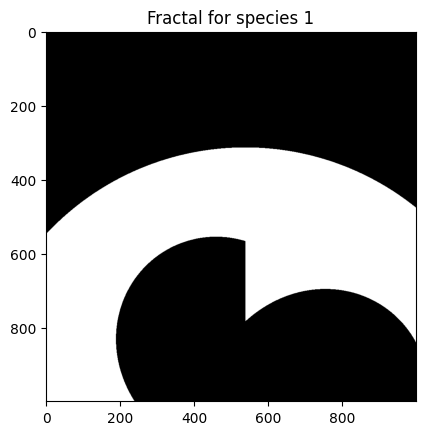

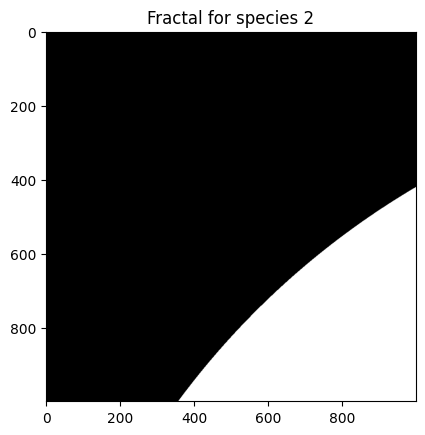

dans aucune fractale


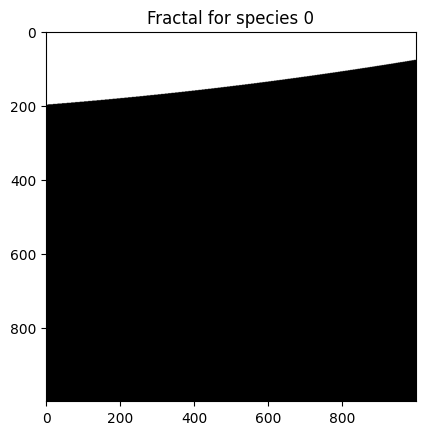

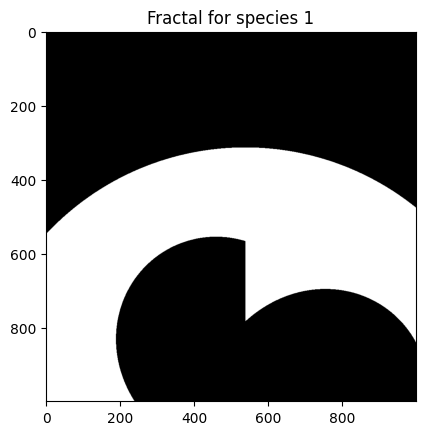

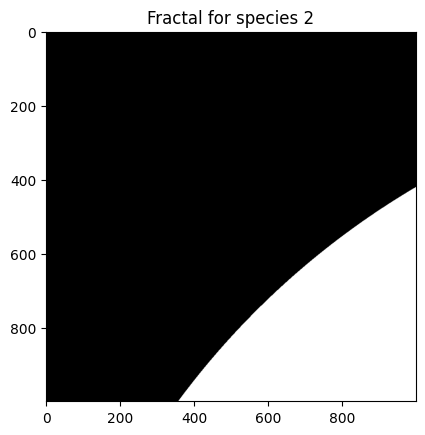

dans aucune fractale


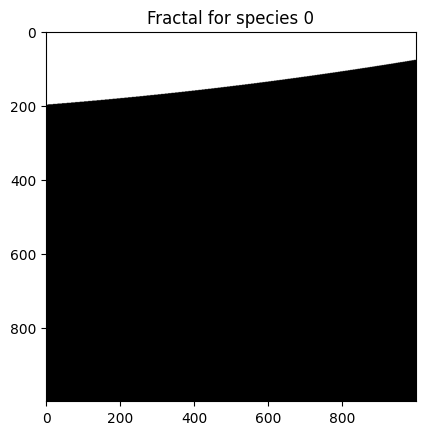

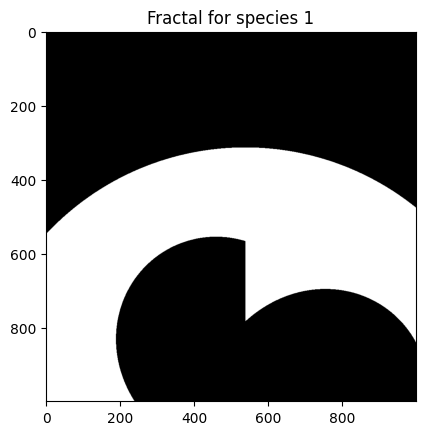

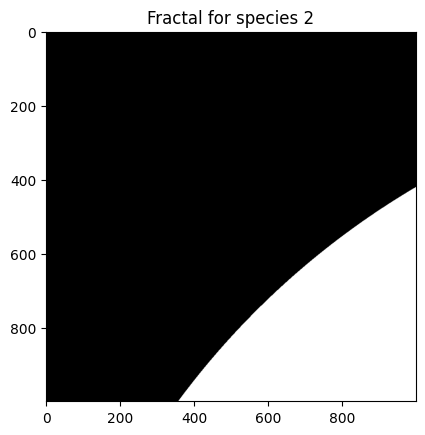

dans aucune fractale


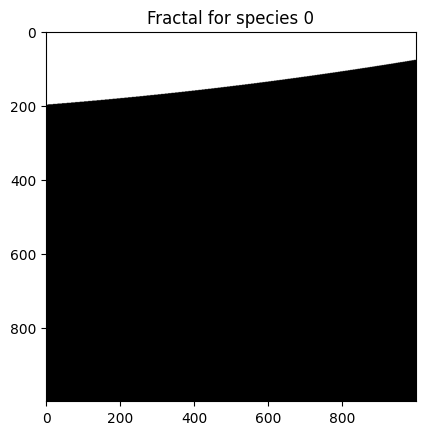

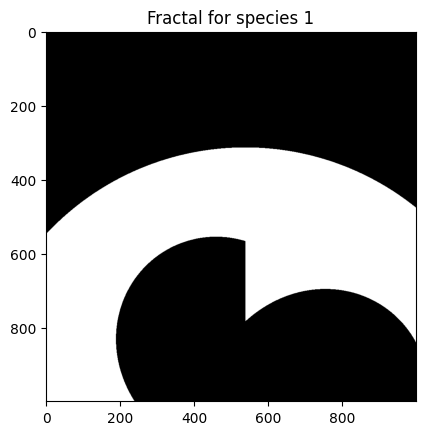

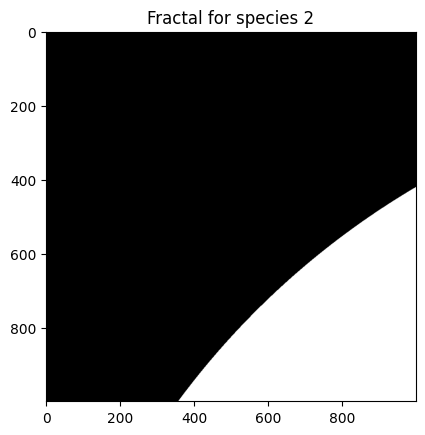

dans aucune fractale


In [15]:
labels_by_species = {}
for species in [0, 1, 2]:
    labels_by_species[species] = generate_labels_with_multibrot(gbest_position[species], X_test, x_min=x_min, x_max=x_max, y_min=y_min, y_max=y_max)

y_pred = []
for i, x in enumerate(X_test):
    labels_in_fractal = []

    for species in [0, 1, 2]:
        if labels_by_species[species][i]:
            labels_in_fractal.append(species)

    if len(labels_in_fractal) == 1:
        # Cas 1: Seulement dans une fractale
        y_pred.append(labels_in_fractal[0])
        
    elif len(labels_in_fractal) > 1:
        # Chercher le 0 le plus proche pour exclure
        closest_boundary_label = knn_find_closest_boundary(binary_fractals, x, target_value=1)
        y_pred.append(closest_boundary_label)
        print("dans plusieurs fractales")
    else:
        # Chercher le 1 le plus proche pour inclure
        closest_boundary_label = knn_find_closest_boundary(binary_fractals, x, target_value=0)
        y_pred.append(closest_boundary_label)
        print("dans aucune fractale")

y_pred_np = np.array(y_pred)
y_pred_flat = y_pred_np.flatten()
error_rate = sum([p != t for p, t in zip(y_pred_flat, y_test)]) / len(y_test)


In [16]:
print(error_rate)

[0.3]
